# 11 LaMa Restoration

This notebook runs the LaMa pretrained inpainting baseline on the controlled 50-painting subset.

LaMa is executed through the IOPaint command-line interface using `model=lama`. The notebook keeps the same project structure as the OpenCV Telea baseline:

- input metadata: damaged-image metadata,
- input images: damaged images and masks,
- output images: LaMa-restored images,
- output metadata: `metadata_restored_lama.csv`.

Zero-control cases are copied directly without model inference. This preserves the control condition exactly and avoids unnecessary preprocessing or re-encoding through the model runtime.

The resulting LaMa outputs will later be evaluated using the same metric families as OpenCV Telea:

- classical full-reference metrics,
- difference/error maps,
- LPIPS,
- CLIP and DINOv2 feature-space similarity,
- model-comparison reports.

In [1]:
from pathlib import Path
import sys
import yaml

PROJECT_ROOT = Path.cwd().resolve()
if PROJECT_ROOT.name == "notebooks":
    PROJECT_ROOT = PROJECT_ROOT.parent

SRC_DIR = PROJECT_ROOT / "src"
if str(SRC_DIR) not in sys.path:
    sys.path.insert(0, str(SRC_DIR))

CONFIG_PATH = PROJECT_ROOT / "config" / "experiment_50_config.yaml"

print("Project root:", PROJECT_ROOT)
print("Source directory:", SRC_DIR)
print("Source directory exists:", SRC_DIR.exists())
print("Config path:", CONFIG_PATH)
print("Config exists:", CONFIG_PATH.exists())

if not SRC_DIR.exists():
    raise FileNotFoundError(f"Source directory not found: {SRC_DIR}")

if not CONFIG_PATH.exists():
    raise FileNotFoundError(f"Experiment config not found: {CONFIG_PATH}")

Project root: D:\Masters\FH\Thesis\painting-restoration-eval
Source directory: D:\Masters\FH\Thesis\painting-restoration-eval\src
Source directory exists: True
Config path: D:\Masters\FH\Thesis\painting-restoration-eval\config\experiment_50_config.yaml
Config exists: True


In [2]:
import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image

from restoration_eval.restoration_lama import (
    MODEL_NAME,
    IOPAINT_MODEL_NAME,
    ZERO_CONTROL_MASK_TYPE,
    run_lama_restoration_pipeline,
    validate_lama_restoration_outputs,
    summarize_lama_restoration_metadata,
)

with CONFIG_PATH.open("r", encoding="utf-8") as f:
    config = yaml.safe_load(f)

paths_cfg = config.get("paths", {})
preprocessing_cfg = config.get("preprocessing", {})

processed_metadata_dir = PROJECT_ROOT / paths_cfg["processed_metadata_dir"]
damaged_metadata_path = processed_metadata_dir / "metadata_damaged_images.csv"

restored_lama_dir = PROJECT_ROOT / paths_cfg["restored_dir"] / MODEL_NAME
restored_lama_metadata_path = processed_metadata_dir / "metadata_restored_lama.csv"

metrics_dir = PROJECT_ROOT / paths_cfg["metrics_dir"]
metrics_dir.mkdir(parents=True, exist_ok=True)

outputs_tmp_dir = PROJECT_ROOT / "outputs" / "tmp"
lama_test_staging_root = outputs_tmp_dir / "lama_batch_test_notebook"
lama_full_staging_root = outputs_tmp_dir / "lama_batch_full"

lama_overview_summary_path = metrics_dir / "lama_restoration_overview_summary_50.csv"
lama_by_mask_summary_path = metrics_dir / "lama_restoration_by_mask_type_summary_50.csv"
lama_by_inference_mode_summary_path = metrics_dir / "lama_restoration_by_inference_mode_summary_50.csv"
lama_validation_summary_path = metrics_dir / "lama_restoration_validation_summary_50.csv"

target_size = (
    preprocessing_cfg.get("output_size")
    or preprocessing_cfg.get("target_size")
    or config.get("experiment", {}).get("image_size")
    or 768
)

device = "cuda"

print("Damaged metadata:", damaged_metadata_path)
print("Damaged metadata exists:", damaged_metadata_path.exists())
print("LaMa restored output directory:", restored_lama_dir)
print("LaMa restored metadata output:", restored_lama_metadata_path)
print("Test staging root:", lama_test_staging_root)
print("Full staging root:", lama_full_staging_root)
print("Target size:", target_size)
print("Model name:", MODEL_NAME)
print("IOPaint model name:", IOPAINT_MODEL_NAME)
print("Device:", device)

if not damaged_metadata_path.exists():
    raise FileNotFoundError(
        f"Damaged-image metadata not found: {damaged_metadata_path}. "
        "Run Notebook 04 first."
    )

Damaged metadata: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_damaged_images.csv
Damaged metadata exists: True
LaMa restored output directory: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\restored\lama
LaMa restored metadata output: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_lama.csv
Test staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook
Full staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full
Target size: 768
Model name: lama
IOPaint model name: lama
Device: cuda


In [3]:
damaged_metadata_df = pd.read_csv(damaged_metadata_path)

print("Damaged metadata shape:", damaged_metadata_df.shape)
display(damaged_metadata_df.head())

print("\nColumns:")
print(list(damaged_metadata_df.columns))

print("\nMask type counts:")
display(damaged_metadata_df["mask_type"].value_counts().sort_index())

print("\nStatus counts:")
display(damaged_metadata_df["status"].value_counts(dropna=False))

print("\nIssue counts:")
display(damaged_metadata_df["issue"].fillna("").replace("", "ok").value_counts())

Damaged metadata shape: (250, 19)


,case_id,painting_id,mask_id,mask_type,clean_filename,clean_path,mask_filename,mask_path,damaged_filename,damaged_path,damage_fill_strategy,damage_fill_r,damage_fill_g,damage_fill_b,damaged_area_pixels,damaged_area_percentage_content,damaged_area_percentage_full,status,issue
0,p001_loss_large,p001,p001_loss_large,loss_large,p001_clean.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_loss_large_mask.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_loss_large_damaged.png,D:\Masters\FH\Thesis\painting-restoration-eval...,white_fill,255,255,255,67242,13.2058,11.4003,ok,NaN
1,p001_loss_small,p001,p001_loss_small,loss_small,p001_clean.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_loss_small_mask.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_loss_small_damaged.png,D:\Masters\FH\Thesis\painting-restoration-eval...,white_fill,255,255,255,24198,4.7523,4.1026,ok,NaN
2,p001_mixed_damage,p001,p001_mixed_damage,mixed_damage,p001_clean.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_mixed_damage_mask.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_mixed_damage_damaged.png,D:\Masters\FH\Thesis\painting-restoration-eval...,white_fill,255,255,255,44392,8.7183,7.5263,ok,NaN
3,p001_scratch_thin,p001,p001_scratch_thin,scratch_thin,p001_clean.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_scratch_thin_mask.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_scratch_thin_damaged.png,D:\Masters\FH\Thesis\painting-restoration-eval...,white_fill,255,255,255,8012,1.5735,1.3584,ok,NaN
4,p001_zero_control,p001,p001_zero_control,zero_control,p001_clean.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_zero_control_mask.png,D:\Masters\FH\Thesis\painting-restoration-eval...,p001_zero_control_damaged.png,D:\Masters\FH\Thesis\painting-restoration-eval...,white_fill,255,255,255,0,0.0000,0.0000,ok,NaN



Columns:
['case_id', 'painting_id', 'mask_id', 'mask_type', 'clean_filename', 'clean_path', 'mask_filename', 'mask_path', 'damaged_filename', 'damaged_path', 'damage_fill_strategy', 'damage_fill_r', 'damage_fill_g', 'damage_fill_b', 'damaged_area_pixels', 'damaged_area_percentage_content', 'damaged_area_percentage_full', 'status', 'issue']

Mask type counts:


mask_type
loss_large      50
loss_small      50
mixed_damage    50
scratch_thin    50
zero_control    50
Name: count, dtype: int64


Status counts:


status
ok    250
Name: count, dtype: int64


Issue counts:


issue
ok    250
Name: count, dtype: int64

In [4]:
required_columns = [
    "case_id",
    "painting_id",
    "mask_id",
    "mask_type",
    "clean_path",
    "damaged_path",
    "mask_path",
    "status",
]

missing_columns = [
    column for column in required_columns
    if column not in damaged_metadata_df.columns
]

if missing_columns:
    raise ValueError(f"Damaged metadata missing required columns: {missing_columns}")

if len(damaged_metadata_df) != 250:
    raise ValueError(f"Expected 250 damaged metadata rows, found {len(damaged_metadata_df)}.")

if damaged_metadata_df["case_id"].duplicated().any():
    duplicate_cases = damaged_metadata_df.loc[
        damaged_metadata_df["case_id"].duplicated(),
        "case_id",
    ].tolist()
    raise ValueError(f"Duplicate case IDs found: {duplicate_cases[:10]}")

if (damaged_metadata_df["status"] != "ok").any():
    failed_rows = damaged_metadata_df[damaged_metadata_df["status"] != "ok"]
    display(failed_rows)
    raise ValueError("Some damaged-image rows have non-ok status.")

expected_mask_counts = {
    "loss_large": 50,
    "loss_small": 50,
    "mixed_damage": 50,
    "scratch_thin": 50,
    "zero_control": 50,
}

actual_mask_counts = damaged_metadata_df["mask_type"].value_counts().to_dict()

print("Expected mask counts:", expected_mask_counts)
print("Actual mask counts:", actual_mask_counts)

for mask_type, expected_count in expected_mask_counts.items():
    actual_count = actual_mask_counts.get(mask_type, 0)
    if actual_count != expected_count:
        raise ValueError(
            f"Mask type {mask_type!r}: expected {expected_count}, found {actual_count}."
        )

print("Input metadata gate passed.")

Expected mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50, 'zero_control': 50}
Actual mask counts: {'loss_large': 50, 'loss_small': 50, 'mixed_damage': 50, 'scratch_thin': 50, 'zero_control': 50}
Input metadata gate passed.


In [5]:
path_check_rows = []

for _, row in damaged_metadata_df.iterrows():
    case_id = row["case_id"]

    clean_path = PROJECT_ROOT / row["clean_path"]
    damaged_path = PROJECT_ROOT / row["damaged_path"]
    mask_path = PROJECT_ROOT / row["mask_path"]

    row_result = {
        "case_id": case_id,
        "painting_id": row["painting_id"],
        "mask_type": row["mask_type"],
        "clean_exists": clean_path.exists(),
        "damaged_exists": damaged_path.exists(),
        "mask_exists": mask_path.exists(),
        "clean_size": None,
        "damaged_size": None,
        "mask_size": None,
        "passed": False,
        "issue": "",
    }

    try:
        if not clean_path.exists():
            raise FileNotFoundError(f"Missing clean image: {clean_path}")
        if not damaged_path.exists():
            raise FileNotFoundError(f"Missing damaged image: {damaged_path}")
        if not mask_path.exists():
            raise FileNotFoundError(f"Missing mask image: {mask_path}")

        with Image.open(clean_path) as clean_img:
            row_result["clean_size"] = clean_img.size

        with Image.open(damaged_path) as damaged_img:
            row_result["damaged_size"] = damaged_img.size

        with Image.open(mask_path) as mask_img:
            row_result["mask_size"] = mask_img.size

        expected_size = (target_size, target_size)

        if row_result["clean_size"] != expected_size:
            raise ValueError(f"Unexpected clean size: {row_result['clean_size']}")

        if row_result["damaged_size"] != expected_size:
            raise ValueError(f"Unexpected damaged size: {row_result['damaged_size']}")

        if row_result["mask_size"] != expected_size:
            raise ValueError(f"Unexpected mask size: {row_result['mask_size']}")

        row_result["passed"] = True

    except Exception as exc:
        row_result["issue"] = f"{type(exc).__name__}: {exc}"

    path_check_rows.append(row_result)

path_check_df = pd.DataFrame(path_check_rows)

print("Path/image validation summary:")
display(path_check_df["passed"].value_counts().reset_index(name="cases"))

if not path_check_df["passed"].all():
    display(path_check_df[~path_check_df["passed"]].head(20))
    raise ValueError("Input image/mask validation failed.")

print("All input images and masks exist with expected size.")

Path/image validation summary:


,passed,cases
0,True,250


All input images and masks exist with expected size.


In [6]:
test_painting_id = "p001"

lama_test_df = (
    damaged_metadata_df[damaged_metadata_df["painting_id"] == test_painting_id]
    .copy()
    .sort_values("mask_type")
    .reset_index(drop=True)
)

print("LaMa one-painting test subset shape:", lama_test_df.shape)
display(lama_test_df[["case_id", "painting_id", "mask_type", "damaged_path", "mask_path"]])

expected_test_rows = 5

if len(lama_test_df) != expected_test_rows:
    raise ValueError(
        f"Expected {expected_test_rows} rows for {test_painting_id}, "
        f"found {len(lama_test_df)}."
    )

print("One-painting LaMa test subset ready.")

LaMa one-painting test subset shape: (5, 19)


,case_id,painting_id,mask_type,damaged_path,mask_path
0,p001_loss_large,p001,loss_large,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
1,p001_loss_small,p001,loss_small,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
2,p001_mixed_damage,p001,mixed_damage,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
3,p001_scratch_thin,p001,scratch_thin,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...
4,p001_zero_control,p001,zero_control,D:\Masters\FH\Thesis\painting-restoration-eval...,D:\Masters\FH\Thesis\painting-restoration-eval...


One-painting LaMa test subset ready.


In [7]:
lama_test_result = run_lama_restoration_pipeline(
    lama_test_df,
    restored_output_dir=restored_lama_dir,
    staging_root=lama_test_staging_root,
    project_root=PROJECT_ROOT,
    device=device,
    executable="iopaint",
    progress_every=1,
)

lama_test_restored_df = lama_test_result["restoration_metadata_df"]
lama_test_run_info = lama_test_result["run_info"]

print("\nOne-painting LaMa restoration metadata shape:", lama_test_restored_df.shape)

display(
    lama_test_restored_df[
        [
            "case_id",
            "painting_id",
            "mask_type",
            "model_name",
            "restoration_method",
            "inference_mode",
            "restored_path",
            "device",
            "status",
            "issue",
        ]
    ]
)

print("\nRun return code:", lama_test_run_info["returncode"])
print("Batch runtime seconds:", round(lama_test_run_info["runtime_seconds"], 3))
print("Command log:", lama_test_run_info["command_log_path"])
print("Stdout log:", lama_test_run_info["stdout_log_path"])
print("Stderr log:", lama_test_run_info["stderr_log_path"])

Starting LaMa restoration pipeline
  Input rows: 5
  Restored output dir: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\restored\lama
  Staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook
  Device: cuda
  IOPaint executable: iopaint
  IOPaint model: lama
Preparing LaMa staging folders
  Staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook
  Non-zero cases to stage: 4
  Zero-control cases skipped from staging: 1
Staging LaMa case 1/4
Staging LaMa case 2/4
Staging LaMa case 3/4
Staging LaMa case 4/4
LaMa staging complete
  Staged non-zero rows: 4
  Staging input dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\input
  Staging mask dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\mask
  Staging output dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\output
Running I

,case_id,painting_id,mask_type,model_name,restoration_method,inference_mode,restored_path,device,status,issue
0,p001_loss_large,p001,loss_large,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_loss_large_r...,cuda,ok,
1,p001_loss_small,p001,loss_small,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_loss_small_r...,cuda,ok,
2,p001_mixed_damage,p001,mixed_damage,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_mixed_damage...,cuda,ok,
3,p001_scratch_thin,p001,scratch_thin,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_scratch_thin...,cuda,ok,
4,p001_zero_control,p001,zero_control,lama,zero_control_copy,copied_zero_control,data/processed/restored/lama/p001_zero_control...,none,ok,zero_control copied without model inference



Run return code: 0
Batch runtime seconds: 46.264
Command log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\logs\iopaint_command.txt
Stdout log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\logs\iopaint_stdout.txt
Stderr log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_test_notebook\logs\iopaint_stderr.txt


In [8]:
lama_test_validation_df = validate_lama_restoration_outputs(
    lama_test_restored_df,
    project_root=PROJECT_ROOT,
    expected_size=(target_size, target_size),
    progress_every=1,
)

display(lama_test_validation_df)

if not lama_test_validation_df["validation_passed"].all():
    display(lama_test_validation_df[~lama_test_validation_df["validation_passed"]])
    raise ValueError("One-painting LaMa validation failed.")

print("One-painting LaMa validation passed.")

Validating LaMa restored outputs: 5 rows
Validating LaMa output 1/5
Validating LaMa output 2/5
Validating LaMa output 3/5
Validating LaMa output 4/5
Validating LaMa output 5/5
LaMa validation complete
validation_passed
True    5


,case_id,painting_id,mask_type,status,damaged_exists,restored_exists,restored_width,restored_height,restored_mode,exact_match_to_damaged,changed_from_damaged,max_abs_diff,mean_abs_diff,validation_passed,validation_issue
0,p001_loss_large,p001,loss_large,ok,True,True,768,768,RGB,False,True,254.0,24.965486,True,
1,p001_loss_small,p001,loss_small,ok,True,True,768,768,RGB,False,True,252.0,8.849958,True,
2,p001_mixed_damage,p001,mixed_damage,ok,True,True,768,768,RGB,False,True,255.0,17.257073,True,
3,p001_scratch_thin,p001,scratch_thin,ok,True,True,768,768,RGB,False,True,255.0,2.939329,True,
4,p001_zero_control,p001,zero_control,ok,True,True,768,768,RGB,True,False,0.0,0.000000,True,


One-painting LaMa validation passed.


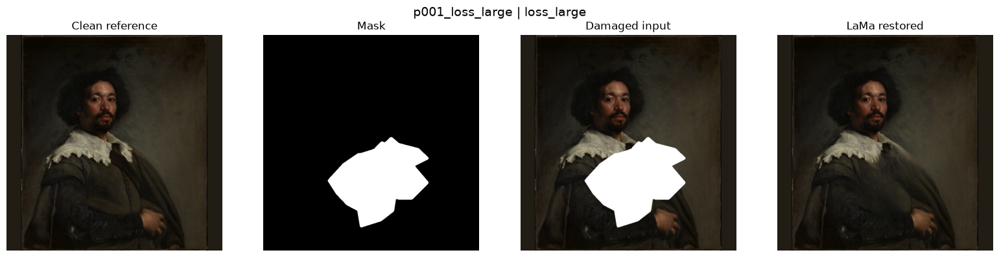

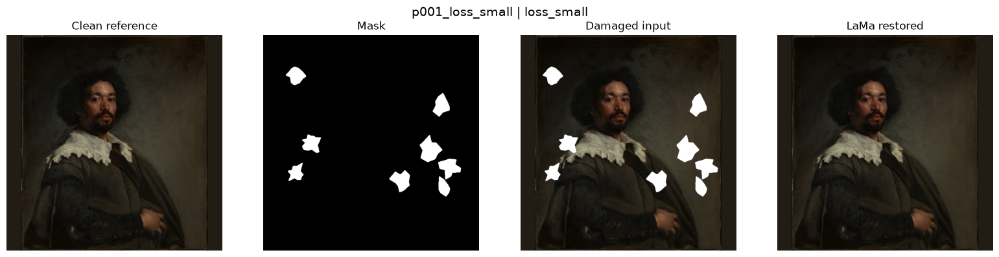

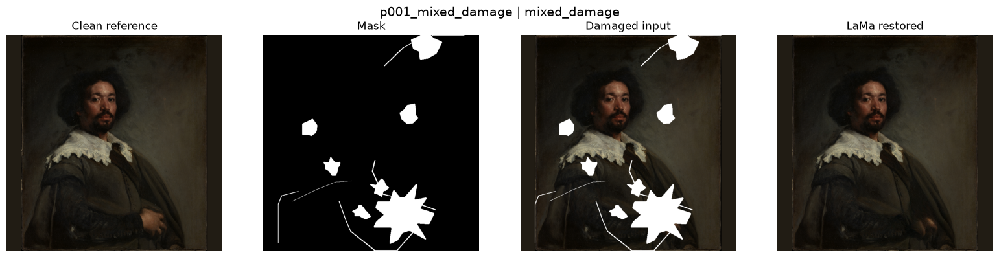

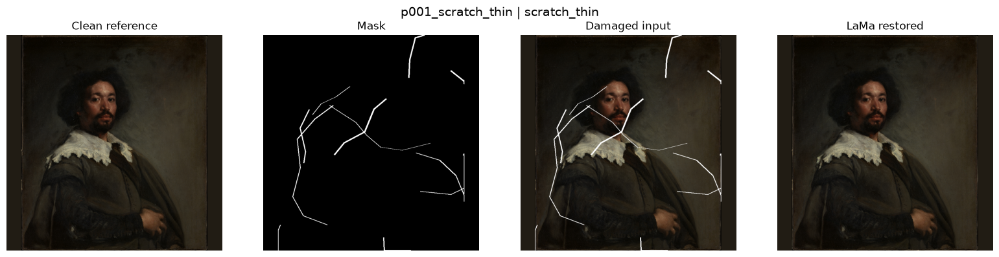

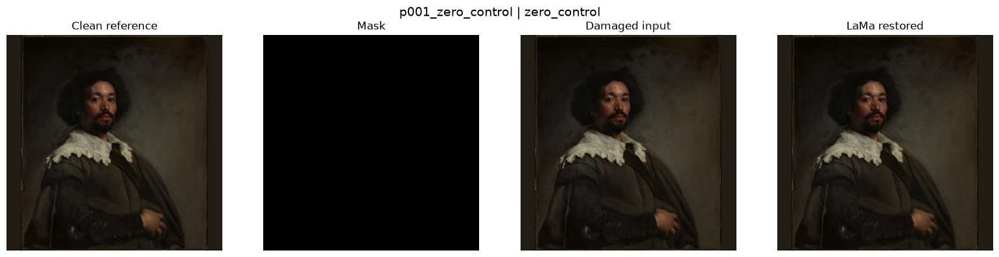

In [9]:
import matplotlib.pyplot as plt

test_display_df = (
    lama_test_restored_df
    .sort_values("mask_type")
    .reset_index(drop=True)
)

for _, row in test_display_df.iterrows():
    case_id = row["case_id"]
    mask_type = row["mask_type"]

    clean_path = PROJECT_ROOT / row["clean_path"]
    damaged_path = PROJECT_ROOT / row["damaged_path"]
    mask_path = PROJECT_ROOT / row["mask_path"]
    restored_path = PROJECT_ROOT / row["restored_path"]

    clean_img = Image.open(clean_path).convert("RGB")
    damaged_img = Image.open(damaged_path).convert("RGB")
    mask_img = Image.open(mask_path).convert("L")
    restored_img = Image.open(restored_path).convert("RGB")

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    axes[0].imshow(clean_img)
    axes[0].set_title("Clean reference")

    axes[1].imshow(mask_img, cmap="gray")
    axes[1].set_title("Mask")

    axes[2].imshow(damaged_img)
    axes[2].set_title("Damaged input")

    axes[3].imshow(restored_img)
    axes[3].set_title("LaMa restored")

    for ax in axes:
        ax.axis("off")

    fig.suptitle(f"{case_id} | {mask_type}", fontsize=14)
    plt.tight_layout()
    plt.show()

In [10]:
lama_full_result = run_lama_restoration_pipeline(
    damaged_metadata_df,
    restored_output_dir=restored_lama_dir,
    staging_root=lama_full_staging_root,
    project_root=PROJECT_ROOT,
    device=device,
    executable="iopaint",
    progress_every=25,
)

lama_restored_df = lama_full_result["restoration_metadata_df"]
lama_full_run_info = lama_full_result["run_info"]

print("\nFull LaMa restoration metadata shape:", lama_restored_df.shape)

display(
    lama_restored_df[
        [
            "case_id",
            "painting_id",
            "mask_type",
            "model_name",
            "restoration_method",
            "inference_mode",
            "restored_path",
            "device",
            "status",
            "issue",
        ]
    ].head(20)
)

print("\nRun return code:", lama_full_run_info["returncode"])
print("Batch runtime seconds:", round(lama_full_run_info["runtime_seconds"], 3))
print("Command log:", lama_full_run_info["command_log_path"])
print("Stdout log:", lama_full_run_info["stdout_log_path"])
print("Stderr log:", lama_full_run_info["stderr_log_path"])

print("\nInference mode counts:")
display(lama_restored_df["inference_mode"].value_counts())

print("\nStatus counts:")
display(lama_restored_df["status"].value_counts(dropna=False))

print("\nMask type counts:")
display(lama_restored_df["mask_type"].value_counts().sort_index())

Starting LaMa restoration pipeline
  Input rows: 250
  Restored output dir: D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\restored\lama
  Staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full
  Device: cuda
  IOPaint executable: iopaint
  IOPaint model: lama
Preparing LaMa staging folders
  Staging root: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full
  Non-zero cases to stage: 200
  Zero-control cases skipped from staging: 50
Staging LaMa case 1/200
Staging LaMa case 25/200
Staging LaMa case 50/200
Staging LaMa case 75/200
Staging LaMa case 100/200
Staging LaMa case 125/200
Staging LaMa case 150/200
Staging LaMa case 175/200
Staging LaMa case 200/200
LaMa staging complete
  Staged non-zero rows: 200
  Staging input dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full\input
  Staging mask dir: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full\mask
  Staging 

,case_id,painting_id,mask_type,model_name,restoration_method,inference_mode,restored_path,device,status,issue
0,p001_loss_large,p001,loss_large,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_loss_large_r...,cuda,ok,
1,p001_loss_small,p001,loss_small,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_loss_small_r...,cuda,ok,
2,p001_mixed_damage,p001,mixed_damage,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_mixed_damage...,cuda,ok,
3,p001_scratch_thin,p001,scratch_thin,lama,iopaint_lama,model_inference,data/processed/restored/lama/p001_scratch_thin...,cuda,ok,
4,p001_zero_control,p001,zero_control,lama,zero_control_copy,copied_zero_control,data/processed/restored/lama/p001_zero_control...,none,ok,zero_control copied without model inference
5,p002_loss_large,p002,loss_large,lama,iopaint_lama,model_inference,data/processed/restored/lama/p002_loss_large_r...,cuda,ok,
6,p002_loss_small,p002,loss_small,lama,iopaint_lama,model_inference,data/processed/restored/lama/p002_loss_small_r...,cuda,ok,
7,p002_mixed_damage,p002,mixed_damage,lama,iopaint_lama,model_inference,data/processed/restored/lama/p002_mixed_damage...,cuda,ok,
8,p002_scratch_thin,p002,scratch_thin,lama,iopaint_lama,model_inference,data/processed/restored/lama/p002_scratch_thin...,cuda,ok,
9,p002_zero_control,p002,zero_control,lama,zero_control_copy,copied_zero_control,data/processed/restored/lama/p002_zero_control...,none,ok,zero_control copied without model inference



Run return code: 0
Batch runtime seconds: 302.614
Command log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full\logs\iopaint_command.txt
Stdout log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full\logs\iopaint_stdout.txt
Stderr log: D:\Masters\FH\Thesis\painting-restoration-eval\outputs\tmp\lama_batch_full\logs\iopaint_stderr.txt

Inference mode counts:


inference_mode
model_inference        200
copied_zero_control     50
Name: count, dtype: int64


Status counts:


status
ok    250
Name: count, dtype: int64


Mask type counts:


mask_type
loss_large      50
loss_small      50
mixed_damage    50
scratch_thin    50
zero_control    50
Name: count, dtype: int64

In [11]:
lama_validation_df = validate_lama_restoration_outputs(
    lama_restored_df,
    project_root=PROJECT_ROOT,
    expected_size=(target_size, target_size),
    progress_every=25,
)

print("Full LaMa validation shape:", lama_validation_df.shape)

display(lama_validation_df.head(20))

print("\nValidation passed counts:")
display(lama_validation_df["validation_passed"].value_counts(dropna=False))

print("\nValidation by mask type:")
display(
    lama_validation_df
    .groupby("mask_type")
    .agg(
        cases=("case_id", "count"),
        passed=("validation_passed", "sum"),
        failed=("validation_passed", lambda values: int((~values).sum())),
        mean_abs_diff=("mean_abs_diff", "mean"),
        max_abs_diff=("max_abs_diff", "max"),
    )
    .reset_index()
)

if not lama_validation_df["validation_passed"].all():
    display(lama_validation_df[~lama_validation_df["validation_passed"]])
    raise ValueError("Full LaMa validation failed.")

print("Full LaMa validation passed.")

Validating LaMa restored outputs: 250 rows
Validating LaMa output 1/250
Validating LaMa output 25/250
Validating LaMa output 50/250
Validating LaMa output 75/250
Validating LaMa output 100/250
Validating LaMa output 125/250
Validating LaMa output 150/250
Validating LaMa output 175/250
Validating LaMa output 200/250
Validating LaMa output 225/250
Validating LaMa output 250/250
LaMa validation complete
validation_passed
True    250
Full LaMa validation shape: (250, 15)


,case_id,painting_id,mask_type,status,damaged_exists,restored_exists,restored_width,restored_height,restored_mode,exact_match_to_damaged,changed_from_damaged,max_abs_diff,mean_abs_diff,validation_passed,validation_issue
0,p001_loss_large,p001,loss_large,ok,True,True,768,768,RGB,False,True,254.0,24.965486,True,
1,p001_loss_small,p001,loss_small,ok,True,True,768,768,RGB,False,True,252.0,8.849958,True,
2,p001_mixed_damage,p001,mixed_damage,ok,True,True,768,768,RGB,False,True,255.0,17.257073,True,
3,p001_scratch_thin,p001,scratch_thin,ok,True,True,768,768,RGB,False,True,255.0,2.939329,True,
4,p001_zero_control,p001,zero_control,ok,True,True,768,768,RGB,True,False,0.0,0.000000,True,
5,p002_loss_large,p002,loss_large,ok,True,True,768,768,RGB,False,True,255.0,18.986314,True,
6,p002_loss_small,p002,loss_small,ok,True,True,768,768,RGB,False,True,255.0,7.040552,True,
7,p002_mixed_damage,p002,mixed_damage,ok,True,True,768,768,RGB,False,True,255.0,15.033798,True,
8,p002_scratch_thin,p002,scratch_thin,ok,True,True,768,768,RGB,False,True,255.0,3.170102,True,
9,p002_zero_control,p002,zero_control,ok,True,True,768,768,RGB,True,False,0.0,0.000000,True,



Validation passed counts:


validation_passed
True    250
Name: count, dtype: int64


Validation by mask type:


,mask_type,cases,passed,failed,mean_abs_diff,max_abs_diff
0,loss_large,50,50,0,14.947607,255.0
1,loss_small,50,50,0,5.205088,255.0
2,mixed_damage,50,50,0,11.889051,255.0
3,scratch_thin,50,50,0,2.628648,255.0
4,zero_control,50,50,0,0.000000,0.0


Full LaMa validation passed.


In [12]:
summaries = summarize_lama_restoration_metadata(lama_restored_df)

lama_overview_df = summaries["overview_df"]
lama_by_mask_type_df = summaries["by_mask_type_df"]
lama_by_inference_mode_df = summaries["by_inference_mode_df"]

restored_lama_metadata_path.parent.mkdir(parents=True, exist_ok=True)
metrics_dir.mkdir(parents=True, exist_ok=True)

lama_restored_df.to_csv(restored_lama_metadata_path, index=False)
lama_validation_df.to_csv(lama_validation_summary_path, index=False)

lama_overview_df.to_csv(lama_overview_summary_path, index=False)
lama_by_mask_type_df.to_csv(lama_by_mask_summary_path, index=False)
lama_by_inference_mode_df.to_csv(lama_by_inference_mode_summary_path, index=False)

print("Saved LaMa restoration metadata:")
print(restored_lama_metadata_path)

print("\nSaved LaMa validation summary:")
print(lama_validation_summary_path)

print("\nSaved overview summary:")
print(lama_overview_summary_path)

print("\nSaved mask-type summary:")
print(lama_by_mask_summary_path)

print("\nSaved inference-mode summary:")
print(lama_by_inference_mode_summary_path)

print("\nOverview:")
display(lama_overview_df)

print("\nBy mask type:")
display(lama_by_mask_type_df)

print("\nBy inference mode:")
display(lama_by_inference_mode_df)

Saved LaMa restoration metadata:
D:\Masters\FH\Thesis\painting-restoration-eval\data\processed\metadata\metadata_restored_lama.csv

Saved LaMa validation summary:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lama_restoration_validation_summary_50.csv

Saved overview summary:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lama_restoration_overview_summary_50.csv

Saved mask-type summary:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lama_restoration_by_mask_type_summary_50.csv

Saved inference-mode summary:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lama_restoration_by_inference_mode_summary_50.csv

Overview:


,item,value
0,total_rows,250
1,unique_paintings,50
2,successful_rows,250
3,error_rows,0
4,model_inference_rows,200
5,copied_zero_control_rows,50



By mask type:


,mask_type,cases,successful_cases,error_cases,mean_batch_runtime_seconds
0,loss_large,50,50,0,302.61427
1,loss_small,50,50,0,302.61427
2,mixed_damage,50,50,0,302.61427
3,scratch_thin,50,50,0,302.61427
4,zero_control,50,50,0,0.00000



By inference mode:


,inference_mode,cases,successful_cases,error_cases
0,copied_zero_control,50,50,0
1,model_inference,200,200,0


In [13]:
if not restored_lama_metadata_path.exists():
    raise FileNotFoundError(f"Missing saved metadata: {restored_lama_metadata_path}")

saved_lama_df = pd.read_csv(restored_lama_metadata_path)

if len(saved_lama_df) != 250:
    raise ValueError(f"Expected 250 saved LaMa metadata rows, found {len(saved_lama_df)}.")

if saved_lama_df["case_id"].duplicated().any():
    duplicate_cases = saved_lama_df.loc[
        saved_lama_df["case_id"].duplicated(),
        "case_id",
    ].tolist()
    raise ValueError(f"Duplicate saved LaMa case IDs found: {duplicate_cases[:10]}")

if (saved_lama_df["status"] != "ok").any():
    display(saved_lama_df[saved_lama_df["status"] != "ok"])
    raise ValueError("Saved LaMa metadata contains non-ok rows.")

expected_inference_counts = {
    "model_inference": 200,
    "copied_zero_control": 50,
}

actual_inference_counts = saved_lama_df["inference_mode"].value_counts().to_dict()

print("Expected inference counts:", expected_inference_counts)
print("Actual inference counts:", actual_inference_counts)

for inference_mode, expected_count in expected_inference_counts.items():
    actual_count = actual_inference_counts.get(inference_mode, 0)
    if actual_count != expected_count:
        raise ValueError(
            f"Inference mode {inference_mode!r}: expected {expected_count}, "
            f"found {actual_count}."
        )

restored_missing = []

for _, row in saved_lama_df.iterrows():
    restored_path = PROJECT_ROOT / row["restored_path"]
    if not restored_path.exists():
        restored_missing.append(row["case_id"])

if restored_missing:
    raise FileNotFoundError(
        f"Missing restored images for cases: {restored_missing[:20]}"
    )

print("Final LaMa output gates passed.")

Expected inference counts: {'model_inference': 200, 'copied_zero_control': 50}
Actual inference counts: {'model_inference': 200, 'copied_zero_control': 50}
Final LaMa output gates passed.


In [16]:
# Build a selected visual inspection set for LaMa.
# This is not a metric ranking yet. It is a diagnostic sanity set.

visual_df = lama_restored_df.copy()

# Robustly attach category.
# Prefer existing category if valid, otherwise merge from processed metadata.
processed_clean_metadata_path = processed_metadata_dir / "metadata_processed_clean.csv"

needs_category = (
    "category" not in visual_df.columns
    or visual_df["category"].isna().all()
)

if needs_category and processed_clean_metadata_path.exists():
    processed_meta_df = pd.read_csv(processed_clean_metadata_path)

    if {"painting_id", "category"}.issubset(processed_meta_df.columns):
        visual_df = visual_df.drop(
            columns=[column for column in ["category"] if column in visual_df.columns],
            errors="ignore",
        )

        visual_df = visual_df.merge(
            processed_meta_df[["painting_id", "category"]].drop_duplicates(),
            on="painting_id",
            how="left",
        )

# Final fallback based on the controlled p001-p050 category block structure.
if "category" not in visual_df.columns or visual_df["category"].isna().all():
    def infer_category_from_painting_id(painting_id):
        number = int(str(painting_id).replace("p", ""))

        if 1 <= number <= 10:
            return "portrait_figure"
        if 11 <= number <= 20:
            return "landscape_natural"
        if 21 <= number <= 30:
            return "architecture_structured"
        if 31 <= number <= 40:
            return "abstraction_surrealism"
        if 41 <= number <= 50:
            return "high_texture_brushwork"

        return "unknown_category"

    visual_df["category"] = visual_df["painting_id"].apply(infer_category_from_painting_id)

print("Category counts available for visual selection:")
display(
    visual_df[["painting_id", "category"]]
    .drop_duplicates()
    ["category"]
    .value_counts()
    .sort_index()
)

selected_case_ids = []

# 1. Include one zero-control case to verify exact copy visually.
zero_cases = visual_df[visual_df["mask_type"] == "zero_control"]
if len(zero_cases) > 0:
    selected_case_ids.append(zero_cases.iloc[0]["case_id"])

# 2. Include one large-loss case per category.
for category in sorted(visual_df["category"].dropna().unique()):
    category_loss_large = visual_df[
        (visual_df["category"] == category)
        & (visual_df["mask_type"] == "loss_large")
    ].sort_values("painting_id")

    if len(category_loss_large) > 0:
        selected_case_ids.append(category_loss_large.iloc[0]["case_id"])

# 3. Include abstraction/surrealism mixed damage.
abstraction_mixed = visual_df[
    (visual_df["category"] == "abstraction_surrealism")
    & (visual_df["mask_type"] == "mixed_damage")
].sort_values("painting_id")

if len(abstraction_mixed) > 0:
    selected_case_ids.append(abstraction_mixed.iloc[0]["case_id"])

# 4. Include high-texture mixed damage.
texture_mixed = visual_df[
    (visual_df["category"] == "high_texture_brushwork")
    & (visual_df["mask_type"] == "mixed_damage")
].sort_values("painting_id")

if len(texture_mixed) > 0:
    selected_case_ids.append(texture_mixed.iloc[0]["case_id"])

# 5. Include one scratch case and one small-loss case from p001 as local-damage sanity checks.
for extra_case_id in ["p001_scratch_thin", "p001_loss_small"]:
    if extra_case_id in set(visual_df["case_id"]):
        selected_case_ids.append(extra_case_id)

# De-duplicate while preserving order.
selected_case_ids = list(dict.fromkeys(selected_case_ids))

lama_selected_visual_df = (
    visual_df[visual_df["case_id"].isin(selected_case_ids)]
    .copy()
    .set_index("case_id")
    .loc[selected_case_ids]
    .reset_index()
)

print("Selected LaMa visual inspection cases:", len(lama_selected_visual_df))

display(
    lama_selected_visual_df[
        [
            "case_id",
            "painting_id",
            "category",
            "mask_type",
            "inference_mode",
            "restored_path",
        ]
    ]
)

Category counts available for visual selection:


category
abstraction_surrealism     10
architecture_structured    10
high_texture_brushwork     10
landscape_natural          10
portrait_figure            10
Name: count, dtype: int64

Selected LaMa visual inspection cases: 10


,case_id,painting_id,category,mask_type,inference_mode,restored_path
0,p001_zero_control,p001,portrait_figure,zero_control,copied_zero_control,data/processed/restored/lama/p001_zero_control...
1,p031_loss_large,p031,abstraction_surrealism,loss_large,model_inference,data/processed/restored/lama/p031_loss_large_r...
2,p021_loss_large,p021,architecture_structured,loss_large,model_inference,data/processed/restored/lama/p021_loss_large_r...
3,p041_loss_large,p041,high_texture_brushwork,loss_large,model_inference,data/processed/restored/lama/p041_loss_large_r...
4,p011_loss_large,p011,landscape_natural,loss_large,model_inference,data/processed/restored/lama/p011_loss_large_r...
5,p001_loss_large,p001,portrait_figure,loss_large,model_inference,data/processed/restored/lama/p001_loss_large_r...
6,p031_mixed_damage,p031,abstraction_surrealism,mixed_damage,model_inference,data/processed/restored/lama/p031_mixed_damage...
7,p041_mixed_damage,p041,high_texture_brushwork,mixed_damage,model_inference,data/processed/restored/lama/p041_mixed_damage...
8,p001_scratch_thin,p001,portrait_figure,scratch_thin,model_inference,data/processed/restored/lama/p001_scratch_thin...
9,p001_loss_small,p001,portrait_figure,loss_small,model_inference,data/processed/restored/lama/p001_loss_small_r...


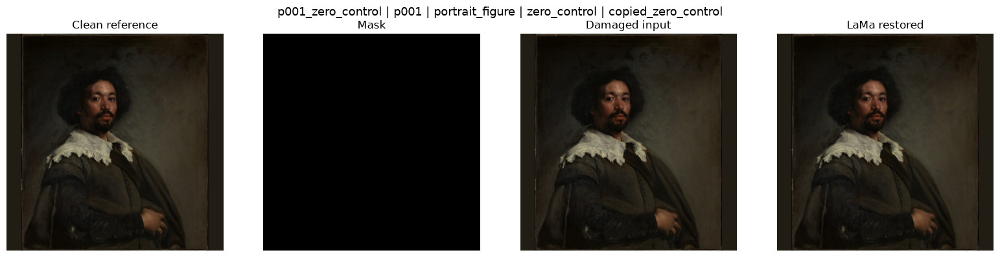

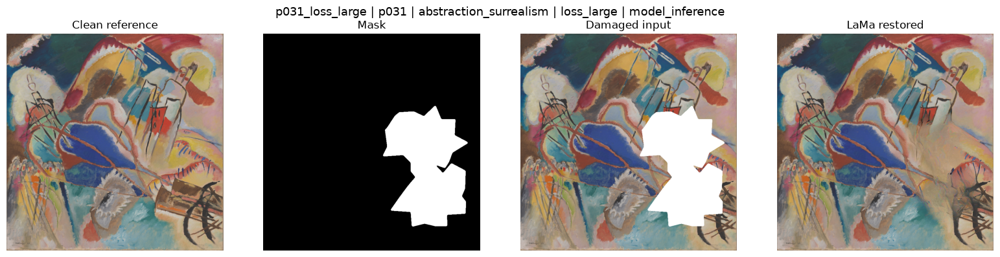

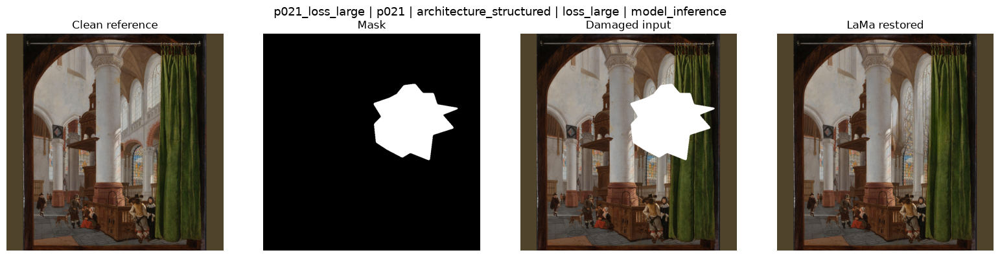

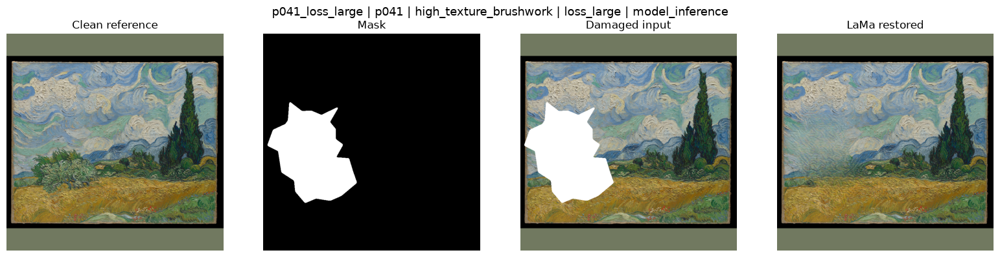

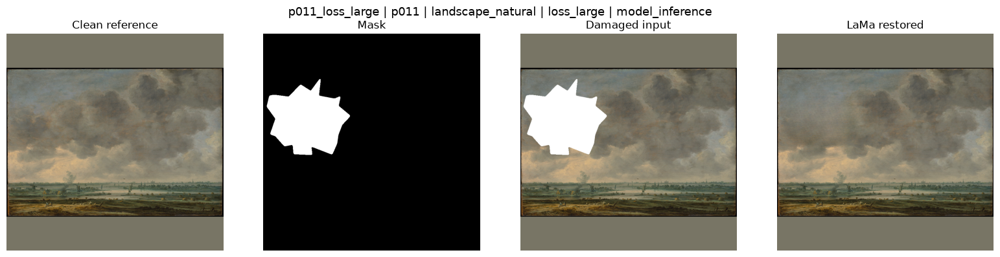

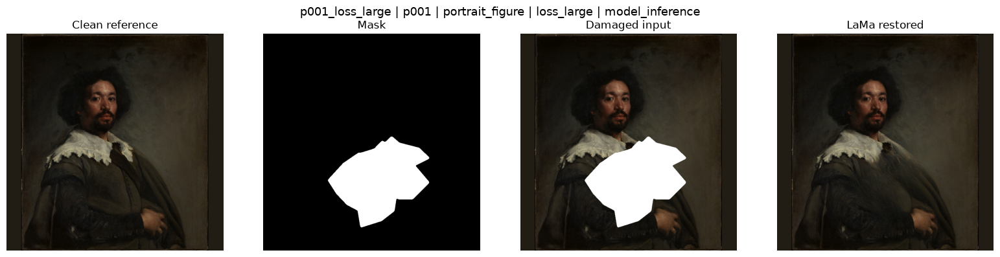

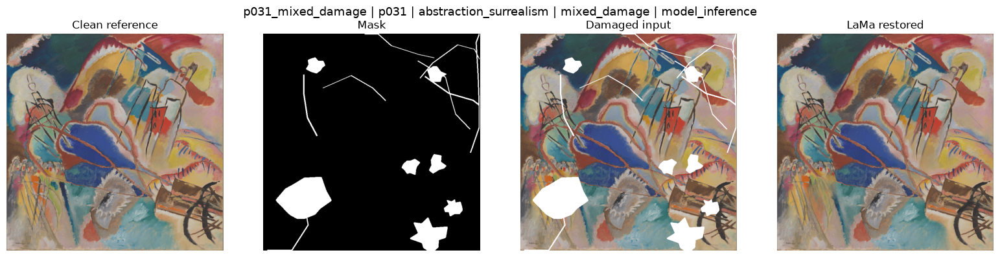

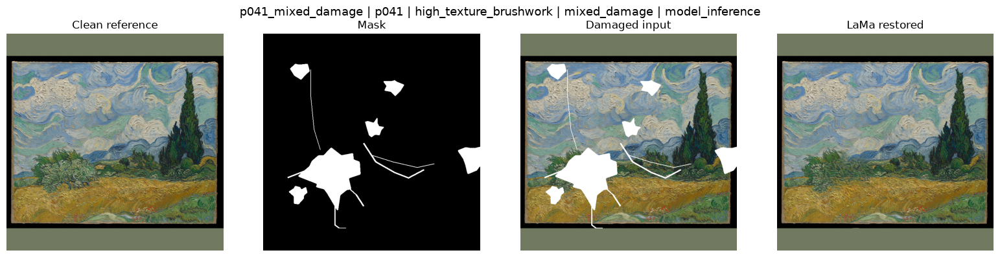

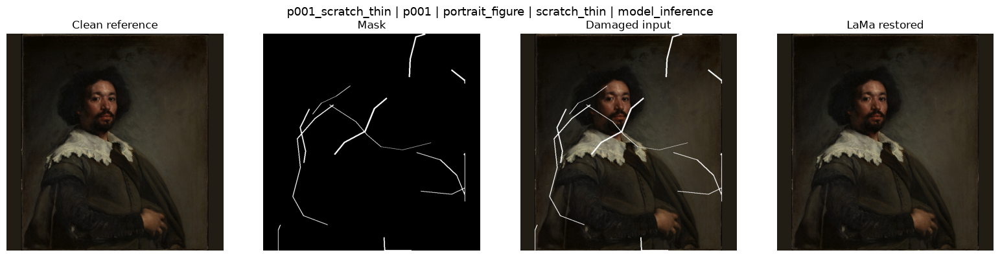

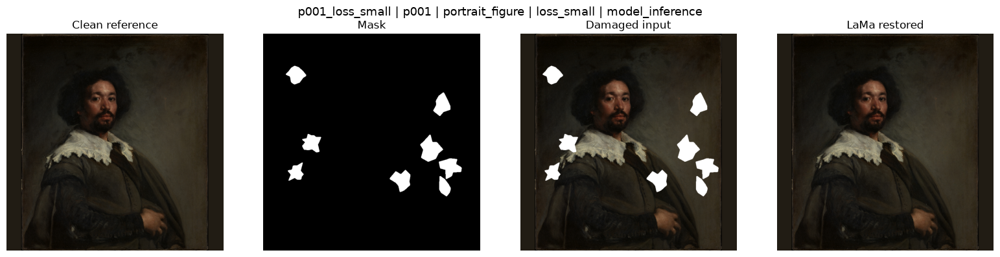

Saved selected LaMa visual inspection manifest:
D:\Masters\FH\Thesis\painting-restoration-eval\outputs\metrics\lama_selected_visual_inspection_manifest_50.csv


,case_id,painting_id,category,mask_type,inference_mode,figure_path
0,p001_zero_control,p001,portrait_figure,zero_control,copied_zero_control,outputs/figures/lama_restoration_selected_case...
1,p031_loss_large,p031,abstraction_surrealism,loss_large,model_inference,outputs/figures/lama_restoration_selected_case...
2,p021_loss_large,p021,architecture_structured,loss_large,model_inference,outputs/figures/lama_restoration_selected_case...
3,p041_loss_large,p041,high_texture_brushwork,loss_large,model_inference,outputs/figures/lama_restoration_selected_case...
4,p011_loss_large,p011,landscape_natural,loss_large,model_inference,outputs/figures/lama_restoration_selected_case...
5,p001_loss_large,p001,portrait_figure,loss_large,model_inference,outputs/figures/lama_restoration_selected_case...
6,p031_mixed_damage,p031,abstraction_surrealism,mixed_damage,model_inference,outputs/figures/lama_restoration_selected_case...
7,p041_mixed_damage,p041,high_texture_brushwork,mixed_damage,model_inference,outputs/figures/lama_restoration_selected_case...
8,p001_scratch_thin,p001,portrait_figure,scratch_thin,model_inference,outputs/figures/lama_restoration_selected_case...
9,p001_loss_small,p001,portrait_figure,loss_small,model_inference,outputs/figures/lama_restoration_selected_case...


In [17]:
import matplotlib.pyplot as plt

selected_lama_figures_dir = PROJECT_ROOT / "outputs" / "figures" / "lama_restoration_selected_cases"
selected_lama_figures_dir.mkdir(parents=True, exist_ok=True)

selected_visual_manifest_rows = []

for _, row in lama_selected_visual_df.iterrows():
    case_id = row["case_id"]
    painting_id = row["painting_id"]
    category = row["category"]
    mask_type = row["mask_type"]
    inference_mode = row["inference_mode"]

    clean_path = PROJECT_ROOT / row["clean_path"]
    damaged_path = PROJECT_ROOT / row["damaged_path"]
    mask_path = PROJECT_ROOT / row["mask_path"]
    restored_path = PROJECT_ROOT / row["restored_path"]

    clean_img = Image.open(clean_path).convert("RGB")
    damaged_img = Image.open(damaged_path).convert("RGB")
    mask_img = Image.open(mask_path).convert("L")
    restored_img = Image.open(restored_path).convert("RGB")

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    axes[0].imshow(clean_img)
    axes[0].set_title("Clean reference")

    axes[1].imshow(mask_img, cmap="gray")
    axes[1].set_title("Mask")

    axes[2].imshow(damaged_img)
    axes[2].set_title("Damaged input")

    axes[3].imshow(restored_img)
    axes[3].set_title("LaMa restored")

    for ax in axes:
        ax.axis("off")

    fig.suptitle(
        f"{case_id} | {painting_id} | {category} | {mask_type} | {inference_mode}",
        fontsize=13,
    )
    plt.tight_layout()

    figure_path = selected_lama_figures_dir / f"{case_id}_lama_visual_check.png"
    fig.savefig(figure_path, dpi=150, bbox_inches="tight")

    plt.show()
    plt.close(fig)

    selected_visual_manifest_rows.append(
        {
            "case_id": case_id,
            "painting_id": painting_id,
            "category": category,
            "mask_type": mask_type,
            "inference_mode": inference_mode,
            "figure_path": figure_path.relative_to(PROJECT_ROOT).as_posix(),
        }
    )

lama_selected_visual_manifest_df = pd.DataFrame(selected_visual_manifest_rows)

lama_selected_visual_manifest_path = (
    metrics_dir / "lama_selected_visual_inspection_manifest_50.csv"
)

lama_selected_visual_manifest_df.to_csv(
    lama_selected_visual_manifest_path,
    index=False,
)

print("Saved selected LaMa visual inspection manifest:")
print(lama_selected_visual_manifest_path)

display(lama_selected_visual_manifest_df)

## LaMa restoration stage summary

The LaMa pretrained inpainting baseline was run on the controlled 50-painting subset through the IOPaint runtime using `model=lama`.

The final output contains 250 restoration cases:

- 200 non-zero damage cases processed through LaMa model inference,
- 50 zero-control cases copied directly without model inference.

Zero-control cases were copied directly to preserve the no-damage control condition exactly. This avoids unnecessary preprocessing or re-encoding through the model runtime and helps keep later metric checks exact.

The output metadata was saved to:

`data/processed/metadata/metadata_restored_lama.csv`

The restored images were saved to:

`data/processed/restored/lama/`

All outputs were validated for file existence, image size, and basic behavioral expectations. Zero-control outputs must match the damaged input exactly, while non-zero cases must differ from the damaged input.

A selected visual inspection set was also generated before formal metric evaluation. This set includes:

- a zero-control case,
- category-representative large-loss cases,
- abstraction/surrealism and high-texture mixed-damage cases,
- local-damage sanity-check cases.

These visual checks are diagnostic sanity checks only. They are not used as final quality rankings.

The selected visual inspection figures were saved to:

`outputs/figures/lama_restoration_selected_cases/`

The selected-case manifest was saved to:

`outputs/metrics/lama_selected_visual_inspection_manifest_50.csv`

This notebook only generates LaMa restoration candidates. It does not evaluate LaMa quality yet. The next notebooks will reuse the existing metric framework to compare LaMa outputs against the known clean references using:

- classical full-reference metrics,
- difference/error maps,
- LPIPS,
- CLIP and DINOv2 feature-space similarity.

This preserves direct comparability between the OpenCV Telea baseline and the LaMa pretrained baseline within the same 50-painting controlled experiment.